In [111]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [112]:
df = pd.read_csv('cancer_reg.csv', encoding = "ISO-8859-1")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 34 columns):
avgAnnCount                3047 non-null float64
avgDeathsPerYear           3047 non-null int64
TARGET_deathRate           3047 non-null float64
incidenceRate              3047 non-null float64
medIncome                  3047 non-null int64
popEst2015                 3047 non-null int64
povertyPercent             3047 non-null float64
studyPerCap                3047 non-null float64
binnedInc                  3047 non-null object
MedianAge                  3047 non-null float64
MedianAgeMale              3047 non-null float64
MedianAgeFemale            3047 non-null float64
Geography                  3047 non-null object
AvgHouseholdSize           3047 non-null float64
PercentMarried             3047 non-null float64
PctNoHS18_24               3047 non-null float64
PctHS18_24                 3047 non-null float64
PctSomeCol18_24            762 non-null float64
PctBachDeg18_24     

In [113]:
df.columns = [i.lower() for i in df.columns]
df.head().T

,0,1,2,3,4
avganncount,1397,173,102,427,57
avgdeathsperyear,469,70,50,202,26
target_deathrate,164.9,161.3,174.7,194.8,144.4
incidencerate,489.8,411.6,349.7,430.4,350.1
medincome,61898,48127,49348,44243,49955
popest2015,260131,43269,21026,75882,10321
povertypercent,11.2,18.6,14.6,17.1,12.5
studypercap,499.748,23.1112,47.5602,342.637,0
binnedinc,"(61494.5, 125635]","(48021.6, 51046.4]","(48021.6, 51046.4]","(42724.4, 45201]","(48021.6, 51046.4]"
medianage,39.3,33,45,42.8,48.3


In [114]:
def miss(x):
    l = []
    for i in x.columns:
        l.append(x[i].isnull().sum())
        
    miss = pd.DataFrame()
    miss['columns'] = x.columns
    miss['missing'] = l
    miss = miss[miss.missing!=0]
    return miss

In [115]:
miss(df)

,columns,missing
17,pctsomecol18_24,2285
21,pctemployed16_over,152
24,pctprivatecoveragealone,609


In [116]:
state = []

for i in df.geography:
    u = i.split(',')
    state.append(u[1].strip())
    
df['state'] = state
df.head().T

,0,1,2,3,4
avganncount,1397,173,102,427,57
avgdeathsperyear,469,70,50,202,26
target_deathrate,164.9,161.3,174.7,194.8,144.4
incidencerate,489.8,411.6,349.7,430.4,350.1
medincome,61898,48127,49348,44243,49955
popest2015,260131,43269,21026,75882,10321
povertypercent,11.2,18.6,14.6,17.1,12.5
studypercap,499.748,23.1112,47.5602,342.637,0
binnedinc,"(61494.5, 125635]","(48021.6, 51046.4]","(48021.6, 51046.4]","(42724.4, 45201]","(48021.6, 51046.4]"
medianage,39.3,33,45,42.8,48.3


In [117]:
imputer = pd.DataFrame(df.groupby('state').pctemployed16_over.agg('median')).reset_index()
imputer

,state,pctemployed16_over
0,Alabama,48.25
1,Alaska,59.75
2,Arizona,44.30
3,Arkansas,49.90
4,California,52.40
5,Colorado,58.60
6,Connecticut,61.95
7,Delaware,56.50
8,District of Columbia,61.80
9,Florida,45.85


In [118]:
tmp = df.copy()
tmp = pd.merge(tmp,imputer, on='state')
tmp['pctemployed16_over']=np.where(tmp.pctemployed16_over_x.isna(), tmp.pctemployed16_over_y, tmp.pctemployed16_over_x)
tmp.pctemployed16_over.isna().sum()  # imputed

0

In [119]:
df['pctemployed16_over'] = tmp.pctemployed16_over

In [120]:
miss(df)

,columns,missing
17,pctsomecol18_24,2285
24,pctprivatecoveragealone,609


In [121]:
imputer = pd.DataFrame(df.groupby('state').pctprivatecoveragealone.agg('median'))
imputer

,pctprivatecoveragealone
state,
Alabama,44.65
Alaska,48.75
Arizona,37.20
Arkansas,39.70
California,45.50
Colorado,49.80
Connecticut,59.00
Delaware,49.60
District of Columbia,55.60


In [122]:
tmp = df.copy()
tmp = pd.merge(tmp,imputer, on='state')
tmp['pctprivatecoveragealone']=np.where(tmp.pctprivatecoveragealone_x.isna(), tmp.pctprivatecoveragealone_y, tmp.pctprivatecoveragealone_x)
tmp.pctprivatecoveragealone.isna().sum()  # imputed

0

In [123]:
df['pctprivatecoveragealone'] = tmp.pctprivatecoveragealone
df.head().T

,0,1,2,3,4
avganncount,1397,173,102,427,57
avgdeathsperyear,469,70,50,202,26
target_deathrate,164.9,161.3,174.7,194.8,144.4
incidencerate,489.8,411.6,349.7,430.4,350.1
medincome,61898,48127,49348,44243,49955
popest2015,260131,43269,21026,75882,10321
povertypercent,11.2,18.6,14.6,17.1,12.5
studypercap,499.748,23.1112,47.5602,342.637,0
binnedinc,"(61494.5, 125635]","(48021.6, 51046.4]","(48021.6, 51046.4]","(42724.4, 45201]","(48021.6, 51046.4]"
medianage,39.3,33,45,42.8,48.3


In [124]:
miss(df)

,columns,missing
17,pctsomecol18_24,2285


In [125]:
df.drop('pctsomecol18_24', axis=1, inplace=True)

In [126]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 34 columns):
avganncount                3047 non-null float64
avgdeathsperyear           3047 non-null int64
target_deathrate           3047 non-null float64
incidencerate              3047 non-null float64
medincome                  3047 non-null int64
popest2015                 3047 non-null int64
povertypercent             3047 non-null float64
studypercap                3047 non-null float64
binnedinc                  3047 non-null object
medianage                  3047 non-null float64
medianagemale              3047 non-null float64
medianagefemale            3047 non-null float64
geography                  3047 non-null object
avghouseholdsize           3047 non-null float64
percentmarried             3047 non-null float64
pctnohs18_24               3047 non-null float64
pcths18_24                 3047 non-null float64
pctbachdeg18_24            3047 non-null float64
pcths25_over       

In [127]:
df.drop('incidencerate', axis=1, inplace=True)

In [128]:
df.head().T

,0,1,2,3,4
avganncount,1397,173,102,427,57
avgdeathsperyear,469,70,50,202,26
target_deathrate,164.9,161.3,174.7,194.8,144.4
medincome,61898,48127,49348,44243,49955
popest2015,260131,43269,21026,75882,10321
povertypercent,11.2,18.6,14.6,17.1,12.5
studypercap,499.748,23.1112,47.5602,342.637,0
binnedinc,"(61494.5, 125635]","(48021.6, 51046.4]","(48021.6, 51046.4]","(42724.4, 45201]","(48021.6, 51046.4]"
medianage,39.3,33,45,42.8,48.3
medianagemale,36.9,32.2,44,42.2,47.8


In [129]:
kansas_df = df.loc[(df.state=='Kansas')|(df.state=='Colorado')|(df.state=='Nebraska')|(df.state=='Oklahoma')|(df.state=='Missouri')]
min_df = df.loc[(df.state=='Minnesota')|(df.state=='South Dakota')|(df.state=='North Dakota')|(df.state=='Iowa')|(df.state=='Wisconsin')]
nev_df = df.loc[(df.state=='Nevada')|(df.state=='Oregon')|(df.state=='Utah')|(df.state=='Arizona')]

In [130]:
def deciles(x):
    decile = pd.Series(index=[0,1,2,3,4,5,6,7,8,9])
    for i in np.arange(0.1,1.1,0.1):
        decile[int(i*10)]=x.quantile(i)
    def z(x):
        if x<decile[1]:
            return(1)
        elif x<decile[2]:
            return(2)
        elif x<decile[3]:
            return(3)
        elif x<decile[4]:
            return(4)
        elif x<decile[5]:
            return(5)
        elif x<decile[6]:
            return(6)
        elif x<decile[7]:
            return(7)
        elif x<decile[8]:
            return(8)
        elif x<decile[9]:
            return(9)
        elif x<=decile[10]:
            return(10)
        else:
            return(11)
    s=x.map(z)
    return(s)

### cleaning kansas data

In [131]:
l = deciles(kansas_df.popest2015)
kansas_df['pop_dec'] = l
kansas_df1 = kansas_df[kansas_df.state!='Kansas']
g = kansas_df1.groupby('pop_dec').avganncount.agg('median')
g

C:\Users\suraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


pop_dec
1       15.0
2       25.0
3       35.5
4       47.0
5       59.0
6       82.0
7      110.5
8      178.5
9      238.0
10    1004.0
Name: avganncount, dtype: float64

In [132]:
for i in list(kansas_df.pop_dec.unique()):
    kansas_df.loc[(kansas_df.state=='Kansas')&(kansas_df.pop_dec==i), 'avganncount'] = g[i]

C:\Users\suraj\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


### cleaning minnesota data

In [133]:
l = deciles(min_df.popest2015)
min_df['pop_dec'] = l
min_df1 = min_df[min_df.state!='Minnesota']
g = min_df1.groupby('pop_dec').avganncount.agg('median')
g

C:\Users\suraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


pop_dec
1      17.0
2      28.5
3      48.0
4      67.0
5      88.0
6     110.5
7     133.0
8     206.0
9     306.5
10    762.0
Name: avganncount, dtype: float64

In [134]:
for i in list(min_df.pop_dec.unique()):
    min_df.loc[(min_df.state=='Minnesota')&(min_df.pop_dec==i), 'avganncount'] = g[i]

C:\Users\suraj\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [135]:
min_df.loc[min_df.state=='Minnesota']

,avganncount,avgdeathsperyear,target_deathrate,medincome,popest2015,povertypercent,studypercap,binnedinc,medianage,medianagemale,...,pctpubliccoverage,pctpubliccoveragealone,pctwhite,pctblack,pctasian,pctotherrace,pctmarriedhouseholds,birthrate,state,pop_dec
367,110.5,50,164.1,40676,15702,14.9,0.000000,"(40362.7, 42724.4]",53.1,52.7,...,51.5,22.3,95.075447,0.366185,0.309363,0.082076,53.344723,7.867412,Minnesota,6
368,762.0,497,167.9,70868,344151,7.6,418.420984,"(61494.5, 125635]",37.9,37.2,...,25.7,12.9,85.664652,4.901347,4.089277,1.694100,56.433719,6.191393,Minnesota,10
369,206.0,86,189.3,51116,33386,14.6,0.000000,"(51046.4, 54545.6]",42.4,42.0,...,38.4,20.0,87.757258,0.516024,0.464723,0.374193,54.033328,5.235358,Minnesota,8
370,306.5,79,162.6,43706,45672,18.5,1050.972149,"(42724.4, 45201]",33.3,31.8,...,40.5,26.1,74.089889,0.818770,0.871594,0.261918,44.602425,6.561705,Minnesota,9
371,206.0,63,155.3,52531,39710,13.6,0.000000,"(51046.4, 54545.6]",35.4,35.3,...,32.2,18.0,94.314270,2.325285,1.132047,0.117284,48.055271,7.207015,Minnesota,8
2453,28.5,19,178.0,46495,5040,12.8,0.000000,"(45201, 48021.6]",49.2,47.6,...,38.7,14.9,98.032723,0.194780,0.077912,0.116868,56.354075,7.093822,Minnesota,2
2454,306.5,100,151.9,49513,65787,17.9,45.601715,"(48021.6, 51046.4]",30.1,29.3,...,26.5,13.0,92.069098,3.107869,2.031478,0.428407,46.243007,4.611181,Minnesota,9
2455,133.0,65,161.5,52272,25313,8.9,1896.258839,"(51046.4, 54545.6]",43.5,42.0,...,30.6,11.0,97.369147,0.448978,0.433224,0.744358,52.523645,5.656722,Minnesota,7
2456,206.0,83,187.8,53291,35569,12.1,0.000000,"(51046.4, 54545.6]",41.0,40.6,...,34.1,17.9,89.653810,1.238608,0.584036,0.158000,51.246455,5.169122,Minnesota,8
2457,762.0,111,148.8,88500,98741,4.8,638.032833,"(61494.5, 125635]",36.9,36.1,...,17.0,7.4,93.047067,1.187902,2.522071,0.607010,64.905145,5.473379,Minnesota,10


### cleaning nevada data

In [136]:
l = deciles(nev_df.popest2015)
nev_df['pop_dec'] = l
nev_df1 = nev_df[nev_df.state!='Nevada']
g = nev_df1.groupby('pop_dec').avganncount.agg('median')
g

C:\Users\suraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


pop_dec
1       14.0
2       43.0
3       37.0
4      103.0
5      147.5
6      156.0
7      348.0
8      547.5
9     1208.0
10    2730.5
Name: avganncount, dtype: float64

In [137]:
for i in list(nev_df.pop_dec.unique()):
    nev_df.loc[(nev_df.state=='Nevada')&(nev_df.pop_dec==i), 'avganncount'] = g[i]

C:\Users\suraj\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [138]:
nev_df[nev_df.state=='Nevada']

,avganncount,avgdeathsperyear,target_deathrate,medincome,popest2015,povertypercent,studypercap,binnedinc,medianage,medianagemale,...,pctpubliccoverage,pctpubliccoveragealone,pctwhite,pctblack,pctasian,pctotherrace,pctmarriedhouseholds,birthrate,state,pop_dec
111,147.5,62,211.0,46840,24200,13.2,0.000000,"(45201, 48021.6]",38.9,37.1,...,37.0,17.3,81.840673,2.370938,2.667821,3.645060,49.699208,7.724034,Nevada,5
112,2730.5,3120,167.7,51241,2114801,15.6,405.239075,"(51046.4, 54545.6]",36.4,35.9,...,27.3,16.0,63.750484,10.836856,9.169757,10.145895,43.813065,5.125073,Nevada,10
113,156.0,108,145.2,60322,47710,10.3,0.000000,"(54545.6, 61494.5]",49.4,48.7,...,35.8,12.9,89.151273,0.554392,1.305571,3.499862,56.135295,5.193754,Nevada,6
114,156.0,55,143.2,72648,51935,10.8,0.000000,"(61494.5, 125635]",33.5,32.9,...,18.5,10.0,88.136612,1.289709,0.927039,2.561964,57.820976,6.700734,Nevada,6
115,14.0,4,262.1,47180,829,14.0,0.000000,"(45201, 48021.6]",46.5,43.0,...,37.1,16.5,87.379492,0.000000,0.000000,7.975460,40.579710,4.326923,Nevada,1
116,14.0,4,178.7,70535,2016,9.8,0.000000,"(61494.5, 125635]",43.9,44.9,...,18.6,2.6,95.805872,0.119832,0.000000,1.437987,56.062581,2.412869,Nevada,1
117,103.0,27,191.5,67423,17019,10.7,0.000000,"(61494.5, 125635]",35.3,34.9,...,20.6,11.6,87.062753,0.451163,0.316400,4.371008,51.357944,5.517423,Nevada,4
118,43.0,7,123.8,74347,5903,11.0,0.000000,"(61494.5, 125635]",37.2,36.4,...,24.4,11.3,88.446014,0.134544,0.807265,2.371342,56.906339,11.631799,Nevada,2
119,43.0,9,127.4,45629,5036,15.1,0.000000,"(45201, 48021.6]",37.4,37.3,...,31.5,15.5,90.643050,2.926454,0.077012,0.904890,59.214020,4.519774,Nevada,2
120,348.0,124,195.7,48576,52585,13.7,0.000000,"(48021.6, 51046.4]",43.2,43.1,...,37.5,19.1,85.736686,0.936949,1.306696,5.426177,51.966810,4.629630,Nevada,7


In [139]:
df.loc[(df.state=='Nevada'), 'avganncount'] = nev_df.loc[nev_df.state=='Nevada', 'avganncount']

In [140]:
df.loc[df.state=='Minnesota', 'avganncount'] = min_df.loc[min_df.state=='Minnesota', 'avganncount']

In [141]:
df.loc[df.state=='Kansas', 'avganncount']= kansas_df.loc[kansas_df.state=='Kansas', 'avganncount']

In [142]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 33 columns):
avganncount                3047 non-null float64
avgdeathsperyear           3047 non-null int64
target_deathrate           3047 non-null float64
medincome                  3047 non-null int64
popest2015                 3047 non-null int64
povertypercent             3047 non-null float64
studypercap                3047 non-null float64
binnedinc                  3047 non-null object
medianage                  3047 non-null float64
medianagemale              3047 non-null float64
medianagefemale            3047 non-null float64
geography                  3047 non-null object
avghouseholdsize           3047 non-null float64
percentmarried             3047 non-null float64
pctnohs18_24               3047 non-null float64
pcths18_24                 3047 non-null float64
pctbachdeg18_24            3047 non-null float64
pcths25_over               3047 non-null float64
pctbachdeg25_over  

In [146]:
from sklearn.cluster import KMeans
from scipy.stats import zscore
# we can't do score as we have categoric variables... will do min max scaling


In [147]:
# converting binned income manually as it has to retain order

l = list(df.binnedinc.unique())
l

['(61494.5, 125635]',
 '(48021.6, 51046.4]',
 '(42724.4, 45201]',
 '(51046.4, 54545.6]',
 '(37413.8, 40362.7]',
 '(40362.7, 42724.4]',
 '(54545.6, 61494.5]',
 '(34218.1, 37413.8]',
 '[22640, 34218.1]',
 '(45201, 48021.6]']

In [148]:
nu = [9, 6, 4, 7, 2, 3, 8, 1, 0, 5]
nu

[9, 6, 4, 7, 2, 3, 8, 1, 0, 5]

In [149]:
bininc = pd.DataFrame({'inc':l, 'nu':nu})
bininc

,inc,nu
0,"(61494.5, 125635]",9
1,"(48021.6, 51046.4]",6
2,"(42724.4, 45201]",4
3,"(51046.4, 54545.6]",7
4,"(37413.8, 40362.7]",2
5,"(40362.7, 42724.4]",3
6,"(54545.6, 61494.5]",8
7,"(34218.1, 37413.8]",1
8,"[22640, 34218.1]",0
9,"(45201, 48021.6]",5


In [150]:
sdf = df.copy()

In [151]:
t = []
for i in sdf.binnedinc:
    for j in range(bininc.shape[0]):
        if i==bininc.inc[j]:
            t.append(bininc.nu[j])
        else:
            pass
        
t

[9,
 6,
 6,
 4,
 6,
 7,
 2,
 2,
 3,
 8,
 8,
 7,
 7,
 9,
 6,
 4,
 9,
 6,
 6,
 7,
 3,
 4,
 1,
 8,
 2,
 0,
 4,
 1,
 0,
 0,
 3,
 1,
 0,
 3,
 1,
 1,
 6,
 3,
 3,
 3,
 9,
 4,
 3,
 1,
 1,
 0,
 4,
 4,
 1,
 1,
 2,
 0,
 4,
 1,
 4,
 1,
 2,
 2,
 4,
 1,
 3,
 8,
 2,
 2,
 5,
 0,
 0,
 2,
 1,
 3,
 2,
 1,
 0,
 2,
 2,
 3,
 1,
 3,
 3,
 5,
 4,
 7,
 6,
 3,
 9,
 7,
 5,
 8,
 4,
 9,
 7,
 6,
 5,
 7,
 6,
 4,
 7,
 3,
 5,
 7,
 9,
 2,
 4,
 8,
 6,
 3,
 4,
 9,
 7,
 3,
 7,
 5,
 7,
 8,
 9,
 5,
 9,
 9,
 9,
 5,
 6,
 3,
 4,
 7,
 8,
 7,
 8,
 5,
 8,
 8,
 8,
 3,
 8,
 9,
 9,
 9,
 8,
 8,
 7,
 9,
 9,
 9,
 8,
 5,
 8,
 9,
 8,
 9,
 9,
 9,
 9,
 9,
 9,
 8,
 8,
 9,
 9,
 9,
 9,
 5,
 0,
 2,
 1,
 1,
 3,
 0,
 2,
 8,
 2,
 0,
 1,
 8,
 2,
 9,
 0,
 0,
 0,
 3,
 0,
 1,
 1,
 8,
 5,
 0,
 7,
 0,
 0,
 1,
 1,
 1,
 3,
 8,
 3,
 0,
 5,
 4,
 7,
 3,
 6,
 5,
 1,
 2,
 9,
 9,
 5,
 9,
 9,
 5,
 0,
 9,
 8,
 2,
 7,
 8,
 2,
 6,
 4,
 6,
 9,
 1,
 7,
 2,
 8,
 4,
 1,
 4,
 9,
 2,
 9,
 9,
 5,
 9,
 3,
 9,
 6,
 8,
 1,
 1,
 5,
 2,
 5,
 9,
 9,
 6,
 2,
 2,
 8,
 4,
 6,
 2,


In [152]:
sdf.binnedinc = t

In [153]:
sdf.head().T

,0,1,2,3,4
avganncount,1397,173,102,427,57
avgdeathsperyear,469,70,50,202,26
target_deathrate,164.9,161.3,174.7,194.8,144.4
medincome,61898,48127,49348,44243,49955
popest2015,260131,43269,21026,75882,10321
povertypercent,11.2,18.6,14.6,17.1,12.5
studypercap,499.748,23.1112,47.5602,342.637,0
binnedinc,9,6,6,4,6
medianage,39.3,33,45,42.8,48.3
medianagemale,36.9,32.2,44,42.2,47.8


In [154]:
sdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 33 columns):
avganncount                3047 non-null float64
avgdeathsperyear           3047 non-null int64
target_deathrate           3047 non-null float64
medincome                  3047 non-null int64
popest2015                 3047 non-null int64
povertypercent             3047 non-null float64
studypercap                3047 non-null float64
binnedinc                  3047 non-null int64
medianage                  3047 non-null float64
medianagemale              3047 non-null float64
medianagefemale            3047 non-null float64
geography                  3047 non-null object
avghouseholdsize           3047 non-null float64
percentmarried             3047 non-null float64
pctnohs18_24               3047 non-null float64
pcths18_24                 3047 non-null float64
pctbachdeg18_24            3047 non-null float64
pcths25_over               3047 non-null float64
pctbachdeg25_over   

In [155]:
sdf1 = sdf.drop('geography', axis=1)
sdf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 32 columns):
avganncount                3047 non-null float64
avgdeathsperyear           3047 non-null int64
target_deathrate           3047 non-null float64
medincome                  3047 non-null int64
popest2015                 3047 non-null int64
povertypercent             3047 non-null float64
studypercap                3047 non-null float64
binnedinc                  3047 non-null int64
medianage                  3047 non-null float64
medianagemale              3047 non-null float64
medianagefemale            3047 non-null float64
avghouseholdsize           3047 non-null float64
percentmarried             3047 non-null float64
pctnohs18_24               3047 non-null float64
pcths18_24                 3047 non-null float64
pctbachdeg18_24            3047 non-null float64
pcths25_over               3047 non-null float64
pctbachdeg25_over          3047 non-null float64
pctemployed16_over 

In [156]:
for i in sdf1.columns:
    if np.dtype(sdf1[i])== 'object':
        sdf1[i] = pd.Categorical(sdf[i]).codes

In [157]:
sdf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 32 columns):
avganncount                3047 non-null float64
avgdeathsperyear           3047 non-null int64
target_deathrate           3047 non-null float64
medincome                  3047 non-null int64
popest2015                 3047 non-null int64
povertypercent             3047 non-null float64
studypercap                3047 non-null float64
binnedinc                  3047 non-null int64
medianage                  3047 non-null float64
medianagemale              3047 non-null float64
medianagefemale            3047 non-null float64
avghouseholdsize           3047 non-null float64
percentmarried             3047 non-null float64
pctnohs18_24               3047 non-null float64
pcths18_24                 3047 non-null float64
pctbachdeg18_24            3047 non-null float64
pcths25_over               3047 non-null float64
pctbachdeg25_over          3047 non-null float64
pctemployed16_over 

In [158]:
sdf1.head().T

,0,1,2,3,4
avganncount,1397.000000,173.000000,102.000000,427.000000,57.000000
avgdeathsperyear,469.000000,70.000000,50.000000,202.000000,26.000000
target_deathrate,164.900000,161.300000,174.700000,194.800000,144.400000
medincome,61898.000000,48127.000000,49348.000000,44243.000000,49955.000000
popest2015,260131.000000,43269.000000,21026.000000,75882.000000,10321.000000
povertypercent,11.200000,18.600000,14.600000,17.100000,12.500000
studypercap,499.748204,23.111234,47.560164,342.637253,0.000000
binnedinc,9.000000,6.000000,6.000000,4.000000,6.000000
medianage,39.300000,33.000000,45.000000,42.800000,48.300000
medianagemale,36.900000,32.200000,44.000000,42.200000,47.800000


In [159]:
# doing min max scaling:

for i in sdf1.columns:
    sdf1[i] = (sdf1[i] - min(sdf1[i]))/(max(sdf1[i]) - min(sdf1[i]))
    
sdf1.head().T

,0,1,2,3,4
avganncount,0.036467,0.004378,0.002517,0.011037,0.001337
avgdeathsperyear,0.033269,0.004783,0.003355,0.014207,0.001642
target_deathrate,0.347080,0.335203,0.379413,0.445727,0.279446
medincome,0.381164,0.247459,0.259314,0.209748,0.265207
popest2015,0.025498,0.004173,0.001986,0.007380,0.000934
povertypercent,0.180995,0.348416,0.257919,0.314480,0.210407
studypercap,0.051192,0.002367,0.004872,0.035098,0.000000
binnedinc,1.000000,0.666667,0.666667,0.444444,0.666667
medianage,0.028253,0.017783,0.037726,0.034070,0.043211
medianagemale,0.342790,0.231678,0.510638,0.468085,0.600473


In [160]:
for i in sdf1.columns:
    print(i, min(sdf1[i]), max(sdf1[i]))

avganncount 0.0 1.0
avgdeathsperyear 0.0 1.0
target_deathrate 0.0 1.0
medincome 0.0 1.0
popest2015 0.0 1.0
povertypercent 0.0 1.0
studypercap 0.0 1.0
binnedinc 0.0 1.0
medianage 0.0 1.0
medianagemale 0.0 1.0
medianagefemale 0.0 1.0
avghouseholdsize 0.0 1.0
percentmarried 0.0 1.0
pctnohs18_24 0.0 1.0
pcths18_24 0.0 1.0
pctbachdeg18_24 0.0 1.0
pcths25_over 0.0 1.0
pctbachdeg25_over 0.0 1.0
pctemployed16_over 0.0 1.0
pctunemployed16_over 0.0 1.0
pctprivatecoverage 0.0 1.0
pctprivatecoveragealone 0.0 1.0
pctempprivcoverage 0.0 1.0
pctpubliccoverage 0.0 1.0
pctpubliccoveragealone 0.0 1.0
pctwhite 0.0 1.0
pctblack 0.0 1.0
pctasian 0.0 1.0
pctotherrace 0.0 1.0
pctmarriedhouseholds 0.0 1.0
birthrate 0.0 1.0
state 0.0 1.0


In [162]:
clus = []
inertia = []

for i in range(1,11):
    clus.append(i)
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(sdf1)
    inertia.append(kmeans.inertia_)

In [163]:
elbow = pd.DataFrame({'cluster':clus, 'inertia':inertia})
elbow

,cluster,inertia
0,1,1884.944418
1,2,1398.445479
2,3,1243.742375
3,4,1150.748089
4,5,1076.419661
5,6,1014.970564
6,7,971.197147
7,8,942.123433
8,9,916.378509
9,10,896.022259


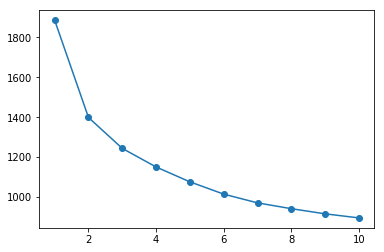

In [164]:
plt.figure()
plt.plot(elbow.cluster, elbow.inertia, marker='o')
plt.show()

In [165]:
# we get the elbow at 2
kmeans2 = KMeans(n_clusters=2)
kmeans2.fit(sdf1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [166]:
centroid2 = pd.DataFrame(kmeans2.cluster_centers_, columns=sdf1.columns)
centroid2

,avganncount,avgdeathsperyear,target_deathrate,medincome,popest2015,povertypercent,studypercap,binnedinc,medianage,medianagemale,...,pctempprivcoverage,pctpubliccoverage,pctpubliccoveragealone,pctwhite,pctblack,pctasian,pctotherrace,pctmarriedhouseholds,birthrate,state
0,0.017469,0.017596,0.356701,0.313789,0.014313,0.212170,0.020709,0.749179,0.036065,0.399155,...,0.587756,0.372531,0.286323,0.864977,0.057707,0.041932,0.048542,0.554403,0.268012,0.540899
1,0.007017,0.007889,0.433336,0.149644,0.005102,0.420495,0.010451,0.215117,0.040591,0.413657,...,0.366020,0.570099,0.483019,0.764126,0.161053,0.015146,0.045893,0.465510,0.260446,0.505664


In [167]:
cent_tmp = centroid2.T
cent_tmp.reset_index(inplace=True)
cent_tmp

,index,0,1
0,avganncount,0.017469,0.007017
1,avgdeathsperyear,0.017596,0.007889
2,target_deathrate,0.356701,0.433336
3,medincome,0.313789,0.149644
4,popest2015,0.014313,0.005102
5,povertypercent,0.212170,0.420495
6,studypercap,0.020709,0.010451
7,binnedinc,0.749179,0.215117
8,medianage,0.036065,0.040591
9,medianagemale,0.399155,0.413657


In [168]:
cent_tmp.columns = ['feature', 'one', 'two']
cent_tmp

,feature,one,two
0,avganncount,0.017469,0.007017
1,avgdeathsperyear,0.017596,0.007889
2,target_deathrate,0.356701,0.433336
3,medincome,0.313789,0.149644
4,popest2015,0.014313,0.005102
5,povertypercent,0.212170,0.420495
6,studypercap,0.020709,0.010451
7,binnedinc,0.749179,0.215117
8,medianage,0.036065,0.040591
9,medianagemale,0.399155,0.413657


In [169]:
cent_tmp['differ'] = cent_tmp.one - cent_tmp.two
cent_tmp

,feature,one,two,differ
0,avganncount,0.017469,0.007017,0.010452
1,avgdeathsperyear,0.017596,0.007889,0.009707
2,target_deathrate,0.356701,0.433336,-0.076635
3,medincome,0.313789,0.149644,0.164146
4,popest2015,0.014313,0.005102,0.009210
5,povertypercent,0.212170,0.420495,-0.208325
6,studypercap,0.020709,0.010451,0.010258
7,binnedinc,0.749179,0.215117,0.534062
8,medianage,0.036065,0.040591,-0.004526
9,medianagemale,0.399155,0.413657,-0.014502


In [170]:
cent_tmp['abs_diff'] = cent_tmp.differ.abs()
cent_tmp

,feature,one,two,differ,abs_diff
0,avganncount,0.017469,0.007017,0.010452,0.010452
1,avgdeathsperyear,0.017596,0.007889,0.009707,0.009707
2,target_deathrate,0.356701,0.433336,-0.076635,0.076635
3,medincome,0.313789,0.149644,0.164146,0.164146
4,popest2015,0.014313,0.005102,0.009210,0.009210
5,povertypercent,0.212170,0.420495,-0.208325,0.208325
6,studypercap,0.020709,0.010451,0.010258,0.010258
7,binnedinc,0.749179,0.215117,0.534062,0.534062
8,medianage,0.036065,0.040591,-0.004526,0.004526
9,medianagemale,0.399155,0.413657,-0.014502,0.014502


In [171]:
cent_tmp = cent_tmp.sort_values(by='abs_diff', ascending=False)
cent_tmp

,feature,one,two,differ,abs_diff
7,binnedinc,0.749179,0.215117,0.534062,0.534062
22,pctempprivcoverage,0.587756,0.366020,0.221736,0.221736
20,pctprivatecoverage,0.704136,0.482835,0.221301,0.221301
5,povertypercent,0.212170,0.420495,-0.208325,0.208325
23,pctpubliccoverage,0.372531,0.570099,-0.197567,0.197567
24,pctpubliccoveragealone,0.286323,0.483019,-0.196696,0.196696
3,medincome,0.313789,0.149644,0.164146,0.164146
17,pctbachdeg25_over,0.343210,0.189848,0.153362,0.153362
19,pctunemployed16_over,0.198605,0.323600,-0.124995,0.124995
26,pctblack,0.057707,0.161053,-0.103346,0.103346


In [172]:
cent_tmp.abs_diff.sum()

2.9580156416437178

In [173]:
cent_tmp['pct_exp'] = (cent_tmp.abs_diff / cent_tmp.abs_diff.sum())
cent_tmp

,feature,one,two,differ,abs_diff,pct_exp
7,binnedinc,0.749179,0.215117,0.534062,0.534062,0.180547
22,pctempprivcoverage,0.587756,0.366020,0.221736,0.221736,0.074961
20,pctprivatecoverage,0.704136,0.482835,0.221301,0.221301,0.074814
5,povertypercent,0.212170,0.420495,-0.208325,0.208325,0.070427
23,pctpubliccoverage,0.372531,0.570099,-0.197567,0.197567,0.066791
24,pctpubliccoveragealone,0.286323,0.483019,-0.196696,0.196696,0.066496
3,medincome,0.313789,0.149644,0.164146,0.164146,0.055492
17,pctbachdeg25_over,0.343210,0.189848,0.153362,0.153362,0.051846
19,pctunemployed16_over,0.198605,0.323600,-0.124995,0.124995,0.042256
26,pctblack,0.057707,0.161053,-0.103346,0.103346,0.034938


In [174]:
cent_tmp1 = cent_tmp[cent_tmp.pct_exp>0.02]
cent_tmp1

,feature,one,two,differ,abs_diff,pct_exp
7,binnedinc,0.749179,0.215117,0.534062,0.534062,0.180547
22,pctempprivcoverage,0.587756,0.366020,0.221736,0.221736,0.074961
20,pctprivatecoverage,0.704136,0.482835,0.221301,0.221301,0.074814
5,povertypercent,0.212170,0.420495,-0.208325,0.208325,0.070427
23,pctpubliccoverage,0.372531,0.570099,-0.197567,0.197567,0.066791
24,pctpubliccoveragealone,0.286323,0.483019,-0.196696,0.196696,0.066496
3,medincome,0.313789,0.149644,0.164146,0.164146,0.055492
17,pctbachdeg25_over,0.343210,0.189848,0.153362,0.153362,0.051846
19,pctunemployed16_over,0.198605,0.323600,-0.124995,0.124995,0.042256
26,pctblack,0.057707,0.161053,-0.103346,0.103346,0.034938


In [175]:
coeff = np.where(cent_tmp1.differ<0, cent_tmp1.pct_exp*(-1), cent_tmp1.pct_exp)
coeff

array([ 0.18054747,  0.07496113,  0.07481404, -0.0704274 , -0.06679054,
       -0.06649599,  0.05549177,  0.05184621, -0.04225637, -0.03493761,
        0.0340944 ,  0.03361043, -0.03168961,  0.03005173, -0.02721241,
       -0.0259075 ,  0.02309707])

In [176]:
np.sum(cent_tmp1.pct_exp)   # by discarding the less than 2% varying features we have retained 96% of the info.

0.9242316848505004

In [177]:
cent_tmp1.shape     # we now have 17 columns only

(17, 6)

In [178]:
r = list(cent_tmp1.feature)
r

['binnedinc',
 'pctempprivcoverage',
 'pctprivatecoverage',
 'povertypercent',
 'pctpubliccoverage',
 'pctpubliccoveragealone',
 'medincome',
 'pctbachdeg25_over',
 'pctunemployed16_over',
 'pctblack',
 'pctwhite',
 'percentmarried',
 'pcths25_over',
 'pctmarriedhouseholds',
 'pctnohs18_24',
 'target_deathrate',
 'pctbachdeg18_24']

In [179]:
tr = df[r]
tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 17 columns):
binnedinc                 3047 non-null object
pctempprivcoverage        3047 non-null float64
pctprivatecoverage        3047 non-null float64
povertypercent            3047 non-null float64
pctpubliccoverage         3047 non-null float64
pctpubliccoveragealone    3047 non-null float64
medincome                 3047 non-null int64
pctbachdeg25_over         3047 non-null float64
pctunemployed16_over      3047 non-null float64
pctblack                  3047 non-null float64
pctwhite                  3047 non-null float64
percentmarried            3047 non-null float64
pcths25_over              3047 non-null float64
pctmarriedhouseholds      3047 non-null float64
pctnohs18_24              3047 non-null float64
target_deathrate          3047 non-null float64
pctbachdeg18_24           3047 non-null float64
dtypes: float64(15), int64(1), object(1)
memory usage: 404.8+ KB


In [180]:
tr.head().T

,0,1,2,3,4
binnedinc,"(61494.5, 125635]","(48021.6, 51046.4]","(48021.6, 51046.4]","(42724.4, 45201]","(48021.6, 51046.4]"
pctempprivcoverage,41.6,43.6,34.9,35,35.1
pctprivatecoverage,75.1,70.2,63.7,58.4,61.6
povertypercent,11.2,18.6,14.6,17.1,12.5
pctpubliccoverage,32.9,31.1,42.1,45.3,44
pctpubliccoveragealone,14,15.3,21.1,25,22.7
medincome,61898,48127,49348,44243,49955
pctbachdeg25_over,19.6,22.7,16,9.3,15
pctunemployed16_over,8,7.8,7,12.1,4.8
pctblack,2.59473,0.969102,0.739673,0.782626,0.270192


In [181]:
tr.shape

(3047, 17)

In [182]:
t

[9,
 6,
 6,
 4,
 6,
 7,
 2,
 2,
 3,
 8,
 8,
 7,
 7,
 9,
 6,
 4,
 9,
 6,
 6,
 7,
 3,
 4,
 1,
 8,
 2,
 0,
 4,
 1,
 0,
 0,
 3,
 1,
 0,
 3,
 1,
 1,
 6,
 3,
 3,
 3,
 9,
 4,
 3,
 1,
 1,
 0,
 4,
 4,
 1,
 1,
 2,
 0,
 4,
 1,
 4,
 1,
 2,
 2,
 4,
 1,
 3,
 8,
 2,
 2,
 5,
 0,
 0,
 2,
 1,
 3,
 2,
 1,
 0,
 2,
 2,
 3,
 1,
 3,
 3,
 5,
 4,
 7,
 6,
 3,
 9,
 7,
 5,
 8,
 4,
 9,
 7,
 6,
 5,
 7,
 6,
 4,
 7,
 3,
 5,
 7,
 9,
 2,
 4,
 8,
 6,
 3,
 4,
 9,
 7,
 3,
 7,
 5,
 7,
 8,
 9,
 5,
 9,
 9,
 9,
 5,
 6,
 3,
 4,
 7,
 8,
 7,
 8,
 5,
 8,
 8,
 8,
 3,
 8,
 9,
 9,
 9,
 8,
 8,
 7,
 9,
 9,
 9,
 8,
 5,
 8,
 9,
 8,
 9,
 9,
 9,
 9,
 9,
 9,
 8,
 8,
 9,
 9,
 9,
 9,
 5,
 0,
 2,
 1,
 1,
 3,
 0,
 2,
 8,
 2,
 0,
 1,
 8,
 2,
 9,
 0,
 0,
 0,
 3,
 0,
 1,
 1,
 8,
 5,
 0,
 7,
 0,
 0,
 1,
 1,
 1,
 3,
 8,
 3,
 0,
 5,
 4,
 7,
 3,
 6,
 5,
 1,
 2,
 9,
 9,
 5,
 9,
 9,
 5,
 0,
 9,
 8,
 2,
 7,
 8,
 2,
 6,
 4,
 6,
 9,
 1,
 7,
 2,
 8,
 4,
 1,
 4,
 9,
 2,
 9,
 9,
 5,
 9,
 3,
 9,
 6,
 8,
 1,
 1,
 5,
 2,
 5,
 9,
 9,
 6,
 2,
 2,
 8,
 4,
 6,
 2,


In [183]:
tr.binnedinc = t
tr.head().T

C:\Users\suraj\Anaconda3\lib\site-packages\pandas\core\generic.py:4405: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


,0,1,2,3,4
binnedinc,9.000000,6.000000,6.000000,4.000000,6.000000
pctempprivcoverage,41.600000,43.600000,34.900000,35.000000,35.100000
pctprivatecoverage,75.100000,70.200000,63.700000,58.400000,61.600000
povertypercent,11.200000,18.600000,14.600000,17.100000,12.500000
pctpubliccoverage,32.900000,31.100000,42.100000,45.300000,44.000000
pctpubliccoveragealone,14.000000,15.300000,21.100000,25.000000,22.700000
medincome,61898.000000,48127.000000,49348.000000,44243.000000,49955.000000
pctbachdeg25_over,19.600000,22.700000,16.000000,9.300000,15.000000
pctunemployed16_over,8.000000,7.800000,7.000000,12.100000,4.800000
pctblack,2.594728,0.969102,0.739673,0.782626,0.270192


In [184]:
tr1 = tr.copy()

In [185]:
# min max normalizing this data as binned income is categoric:
for i in tr1.columns:
    tr1[i] = (tr1[i] - min(tr1[i])) / (max(tr1[i]) - min(tr1[i]))
    
tr1.head().T

,0,1,2,3,4
binnedinc,1.000000,0.666667,0.666667,0.444444,0.666667
pctempprivcoverage,0.491259,0.526224,0.374126,0.375874,0.377622
pctprivatecoverage,0.754286,0.684286,0.591429,0.515714,0.561429
povertypercent,0.180995,0.348416,0.257919,0.314480,0.210407
pctpubliccoverage,0.402597,0.369202,0.573284,0.632653,0.608534
pctpubliccoveragealone,0.259091,0.288636,0.420455,0.509091,0.456818
medincome,0.381164,0.247459,0.259314,0.209748,0.265207
pctbachdeg25_over,0.430730,0.508816,0.340050,0.171285,0.314861
pctunemployed16_over,0.262069,0.255172,0.227586,0.403448,0.151724
pctblack,0.030190,0.011275,0.008606,0.009106,0.003144


In [186]:
for i in tr1.columns:
    print(i, min(tr1[i]), max(tr1[i]))

binnedinc 0.0 1.0
pctempprivcoverage 0.0 1.0
pctprivatecoverage 0.0 1.0
povertypercent 0.0 1.0
pctpubliccoverage 0.0 1.0
pctpubliccoveragealone 0.0 1.0
medincome 0.0 1.0
pctbachdeg25_over 0.0 1.0
pctunemployed16_over 0.0 1.0
pctblack 0.0 1.0
pctwhite 0.0 1.0
percentmarried 0.0 1.0
pcths25_over 0.0 1.0
pctmarriedhouseholds 0.0 1.0
pctnohs18_24 0.0 1.0
target_deathrate 0.0 1.0
pctbachdeg18_24 0.0 1.0


In [187]:
coeff.shape

(17,)

In [188]:
coeff

array([ 0.18054747,  0.07496113,  0.07481404, -0.0704274 , -0.06679054,
       -0.06649599,  0.05549177,  0.05184621, -0.04225637, -0.03493761,
        0.0340944 ,  0.03361043, -0.03168961,  0.03005173, -0.02721241,
       -0.0259075 ,  0.02309707])

In [189]:
val = tr1.values
val

array([[1.        , 0.49125874, 0.75428571, ..., 0.17940718, 0.34708017,
        0.13320463],
       [0.66666667, 0.52622378, 0.68428571, ..., 0.09516381, 0.3352029 ,
        0.14478764],
       [0.66666667, 0.37412587, 0.59142857, ..., 0.37441498, 0.37941274,
        0.18339768],
       ...,
       [0.77777778, 0.59965035, 0.56714286, ..., 0.30733229, 0.31078852,
        0.04826255],
       [0.66666667, 0.63111888, 0.76571429, ..., 0.1700468 , 0.38040251,
        0.07915058],
       [0.33333333, 0.16433566, 0.76857143, ..., 0.12480499, 0.50775322,
        0.09266409]])

In [190]:
val.shape

(3047, 17)

In [191]:
score = np.dot(val, coeff)
score

array([0.29044989, 0.2080011 , 0.1691267 , ..., 0.2305405 , 0.23293395,
       0.12185747])

C:\Users\suraj\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


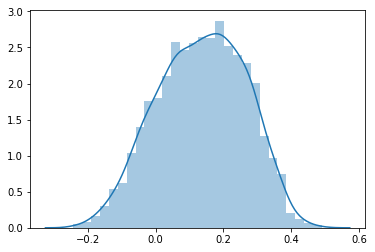

In [192]:
sns.distplot(score)

In [193]:
tr.head().T

,0,1,2,3,4
binnedinc,9.000000,6.000000,6.000000,4.000000,6.000000
pctempprivcoverage,41.600000,43.600000,34.900000,35.000000,35.100000
pctprivatecoverage,75.100000,70.200000,63.700000,58.400000,61.600000
povertypercent,11.200000,18.600000,14.600000,17.100000,12.500000
pctpubliccoverage,32.900000,31.100000,42.100000,45.300000,44.000000
pctpubliccoveragealone,14.000000,15.300000,21.100000,25.000000,22.700000
medincome,61898.000000,48127.000000,49348.000000,44243.000000,49955.000000
pctbachdeg25_over,19.600000,22.700000,16.000000,9.300000,15.000000
pctunemployed16_over,8.000000,7.800000,7.000000,12.100000,4.800000
pctblack,2.594728,0.969102,0.739673,0.782626,0.270192


In [194]:
tr['score'] = score
tr.head().T

C:\Users\suraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,0,1,2,3,4
binnedinc,9.000000,6.000000,6.000000,4.000000,6.000000
pctempprivcoverage,41.600000,43.600000,34.900000,35.000000,35.100000
pctprivatecoverage,75.100000,70.200000,63.700000,58.400000,61.600000
povertypercent,11.200000,18.600000,14.600000,17.100000,12.500000
pctpubliccoverage,32.900000,31.100000,42.100000,45.300000,44.000000
pctpubliccoveragealone,14.000000,15.300000,21.100000,25.000000,22.700000
medincome,61898.000000,48127.000000,49348.000000,44243.000000,49955.000000
pctbachdeg25_over,19.600000,22.700000,16.000000,9.300000,15.000000
pctunemployed16_over,8.000000,7.800000,7.000000,12.100000,4.800000
pctblack,2.594728,0.969102,0.739673,0.782626,0.270192


In [195]:
tr.score.min()

-0.24264713813111993

In [196]:
tr.score.max()

0.4904247764226815

In [216]:
tr.shape

(3047, 20)

In [217]:
tr.columns

Index(['binnedinc', 'pctempprivcoverage', 'pctprivatecoverage',
       'povertypercent', 'pctpubliccoverage', 'pctpubliccoveragealone',
       'medincome', 'pctbachdeg25_over', 'pctunemployed16_over', 'pctblack',
       'pctwhite', 'percentmarried', 'pcths25_over', 'pctmarriedhouseholds',
       'pctnohs18_24', 'target_deathrate', 'pctbachdeg18_24', 'score',
       'geography', 'state'],
      dtype='object')

In [219]:
tr['cl2_labels']=kmeans2.labels_

C:\Users\suraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [220]:
tr.head().T

,0,1,2,3,4
binnedinc,9,6,6,4,6
pctempprivcoverage,41.6,43.6,34.9,35,35.1
pctprivatecoverage,75.1,70.2,63.7,58.4,61.6
povertypercent,11.2,18.6,14.6,17.1,12.5
pctpubliccoverage,32.9,31.1,42.1,45.3,44
pctpubliccoveragealone,14,15.3,21.1,25,22.7
medincome,61898,48127,49348,44243,49955
pctbachdeg25_over,19.6,22.7,16,9.3,15
pctunemployed16_over,8,7.8,7,12.1,4.8
pctblack,2.59473,0.969102,0.739673,0.782626,0.270192


C:\Users\suraj\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\suraj\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


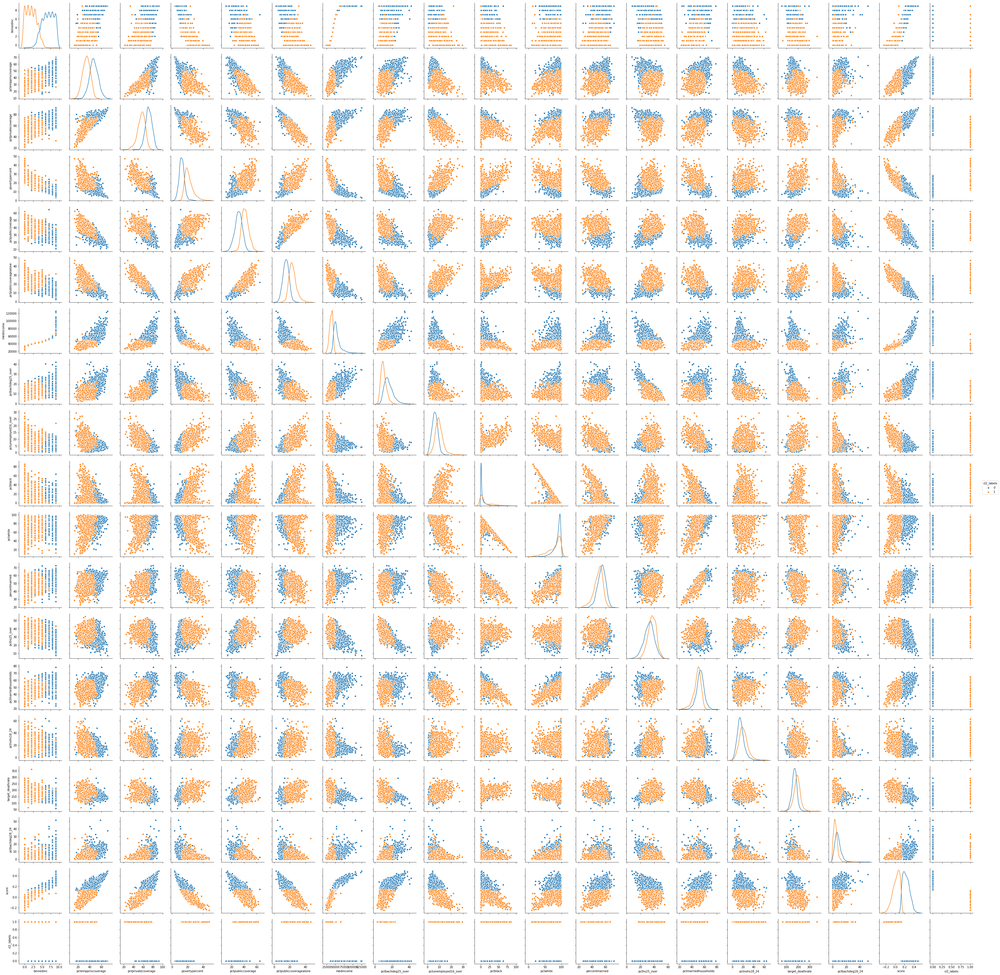

In [221]:
sns.pairplot(tr, diag_kind='kde', hue='cl2_labels')
plt.show()

In [198]:
tr.head()

,binnedinc,pctempprivcoverage,pctprivatecoverage,povertypercent,pctpubliccoverage,pctpubliccoveragealone,medincome,pctbachdeg25_over,pctunemployed16_over,pctblack,pctwhite,percentmarried,pcths25_over,pctmarriedhouseholds,pctnohs18_24,target_deathrate,pctbachdeg18_24,score
0,9,41.6,75.1,11.2,32.9,14.0,61898,19.6,8.0,2.594728,81.780529,52.5,23.2,52.856076,11.5,164.9,6.9,0.290450
1,6,43.6,70.2,18.6,31.1,15.3,48127,22.7,7.8,0.969102,89.228509,44.5,26.0,45.372500,6.1,161.3,7.5,0.208001
2,6,34.9,63.7,14.6,42.1,21.1,49348,16.0,7.0,0.739673,90.922190,54.2,29.0,54.444868,24.0,174.7,9.5,0.169127
3,4,35.0,58.4,17.1,45.3,25.0,44243,9.3,12.1,0.782626,91.744686,52.7,31.6,51.021514,20.2,194.8,2.5,0.083136
4,6,35.1,61.6,12.5,44.0,22.7,49955,15.0,4.8,0.270192,94.104024,57.8,33.4,54.027460,14.9,144.4,2.0,0.171726


In [199]:
tr.shape

(3047, 18)

In [200]:
tr['geography'] = df.geography

C:\Users\suraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [201]:
tr['state'] = df.state

C:\Users\suraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [203]:
pls=tr.sort_values(by='score').head(50)
pls

,binnedinc,pctempprivcoverage,pctprivatecoverage,povertypercent,pctpubliccoverage,pctpubliccoveragealone,medincome,pctbachdeg25_over,pctunemployed16_over,pctblack,pctwhite,percentmarried,pcths25_over,pctmarriedhouseholds,pctnohs18_24,target_deathrate,pctbachdeg18_24,score,geography,state
2825,0,13.5,22.3,47.4,52.3,43.3,27481,10.3,25.4,0.331925,10.199155,28.5,22.2,26.671538,39.9,238.8,0.9,-0.242647,"Todd County, South Dakota",South Dakota
1201,0,23.8,34.9,44.0,52.6,38.7,22640,8.5,19.2,82.559131,16.540592,25.1,36.9,26.464174,13.8,239.7,2.9,-0.231007,"Holmes County, Mississippi",Mississippi
1202,0,23.4,33.5,40.3,53.4,39.8,25562,7.8,26.8,75.400712,22.606857,26.8,27.8,26.987242,24.6,220.9,2.7,-0.230515,"Humphreys County, Mississippi",Mississippi
808,0,22.5,36.3,43.0,51.1,36.3,25402,6.6,19.2,69.710705,28.742834,28.1,38.5,28.864825,39.7,250.7,0.7,-0.225910,"East Carroll Parish, Louisiana",Louisiana
2545,0,23.5,37.9,42.6,52.9,36.7,26083,8.5,17.5,84.866024,13.622722,26.2,29.8,25.501253,9.9,175.9,2.3,-0.209204,"Claiborne County, Mississippi",Mississippi
2625,0,19.6,35.2,37.3,51.9,34.2,27512,2.7,19.2,61.050258,31.797680,38.4,44.8,33.812341,43.3,153.9,0.0,-0.206978,"Clay County, Georgia",Georgia
1235,0,22.1,33.8,36.2,52.6,37.1,26204,9.5,25.3,70.248679,28.939570,36.0,29.1,33.114969,10.7,254.5,3.6,-0.198881,"Quitman County, Mississippi",Mississippi
2784,0,16.8,32.0,38.6,51.4,41.4,31420,12.7,29.4,0.289226,30.995421,39.9,34.4,43.694060,50.1,195.9,2.8,-0.193552,"Corson County, South Dakota",South Dakota
1207,0,28.0,43.0,38.5,52.2,33.4,26408,6.6,15.9,85.947799,13.933562,26.3,36.4,25.540275,15.9,199.1,5.2,-0.193335,"Jefferson County, Mississippi",Mississippi
2711,0,24.3,41.2,33.7,54.8,35.0,24035,8.1,20.8,72.024922,27.352025,33.2,41.3,34.608379,23.5,221.7,5.0,-0.192693,"Wilcox County, Alabama",Alabama


In [204]:
pls.geography

2825           Todd County, South Dakota
1201          Holmes County, Mississippi
1202       Humphreys County, Mississippi
808       East Carroll Parish, Louisiana
2545       Claiborne County, Mississippi
2625                Clay County, Georgia
1235         Quitman County, Mississippi
2784         Corson County, South Dakota
1207       Jefferson County, Mississippi
2711              Wilcox County, Alabama
1428              Greene County, Alabama
2451             Stewart County, Georgia
1217         Leflore County, Mississippi
561            Phillips County, Arkansas
544                 Lee County, Arkansas
1203       Issaquena County, Mississippi
1770    Allendale County, South Carolina
1238         Sharkey County, Mississippi
2548         Coahoma County, Mississippi
175          McKinley County, New Mexico
1251      Washington County, Mississippi
2698               Perry County, Alabama
2572           McCreary County, Kentucky
1242       Sunflower County, Mississippi
823            M

In [222]:
pls.head()

,binnedinc,pctempprivcoverage,pctprivatecoverage,povertypercent,pctpubliccoverage,pctpubliccoveragealone,medincome,pctbachdeg25_over,pctunemployed16_over,pctblack,pctwhite,percentmarried,pcths25_over,pctmarriedhouseholds,pctnohs18_24,target_deathrate,pctbachdeg18_24,score,geography,state
2825,0,13.5,22.3,47.4,52.3,43.3,27481,10.3,25.4,0.331925,10.199155,28.5,22.2,26.671538,39.9,238.8,0.9,-0.242647,"Todd County, South Dakota",South Dakota
1201,0,23.8,34.9,44.0,52.6,38.7,22640,8.5,19.2,82.559131,16.540592,25.1,36.9,26.464174,13.8,239.7,2.9,-0.231007,"Holmes County, Mississippi",Mississippi
1202,0,23.4,33.5,40.3,53.4,39.8,25562,7.8,26.8,75.400712,22.606857,26.8,27.8,26.987242,24.6,220.9,2.7,-0.230515,"Humphreys County, Mississippi",Mississippi
808,0,22.5,36.3,43.0,51.1,36.3,25402,6.6,19.2,69.710705,28.742834,28.1,38.5,28.864825,39.7,250.7,0.7,-0.225910,"East Carroll Parish, Louisiana",Louisiana
2545,0,23.5,37.9,42.6,52.9,36.7,26083,8.5,17.5,84.866024,13.622722,26.2,29.8,25.501253,9.9,175.9,2.3,-0.209204,"Claiborne County, Mississippi",Mississippi


In [225]:
tmp = pls[['geography', 'state', 'score']]
tmp.reset_index(inplace=True, drop=True)
tmp

,geography,state,score
0,"Todd County, South Dakota",South Dakota,-0.242647
1,"Holmes County, Mississippi",Mississippi,-0.231007
2,"Humphreys County, Mississippi",Mississippi,-0.230515
3,"East Carroll Parish, Louisiana",Louisiana,-0.225910
4,"Claiborne County, Mississippi",Mississippi,-0.209204
5,"Clay County, Georgia",Georgia,-0.206978
6,"Quitman County, Mississippi",Mississippi,-0.198881
7,"Corson County, South Dakota",South Dakota,-0.193552
8,"Jefferson County, Mississippi",Mississippi,-0.193335
9,"Wilcox County, Alabama",Alabama,-0.192693


In [226]:
tmp.to_csv('top50.csv', index=False)

In [227]:
tr.head().T

,0,1,2,3,4
binnedinc,9,6,6,4,6
pctempprivcoverage,41.6,43.6,34.9,35,35.1
pctprivatecoverage,75.1,70.2,63.7,58.4,61.6
povertypercent,11.2,18.6,14.6,17.1,12.5
pctpubliccoverage,32.9,31.1,42.1,45.3,44
pctpubliccoveragealone,14,15.3,21.1,25,22.7
medincome,61898,48127,49348,44243,49955
pctbachdeg25_over,19.6,22.7,16,9.3,15
pctunemployed16_over,8,7.8,7,12.1,4.8
pctblack,2.59473,0.969102,0.739673,0.782626,0.270192


In [230]:
tr2 = tr.iloc[:,:-4]
tr2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 17 columns):
binnedinc                 3047 non-null int64
pctempprivcoverage        3047 non-null float64
pctprivatecoverage        3047 non-null float64
povertypercent            3047 non-null float64
pctpubliccoverage         3047 non-null float64
pctpubliccoveragealone    3047 non-null float64
medincome                 3047 non-null int64
pctbachdeg25_over         3047 non-null float64
pctunemployed16_over      3047 non-null float64
pctblack                  3047 non-null float64
pctwhite                  3047 non-null float64
percentmarried            3047 non-null float64
pcths25_over              3047 non-null float64
pctmarriedhouseholds      3047 non-null float64
pctnohs18_24              3047 non-null float64
target_deathrate          3047 non-null float64
pctbachdeg18_24           3047 non-null float64
dtypes: float64(15), int64(2)
memory usage: 404.8 KB


In [231]:
tr2['cl2_labels'] = tr.cl2_labels
tr2['score'] = tr.score

In [232]:
tr2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 19 columns):
binnedinc                 3047 non-null int64
pctempprivcoverage        3047 non-null float64
pctprivatecoverage        3047 non-null float64
povertypercent            3047 non-null float64
pctpubliccoverage         3047 non-null float64
pctpubliccoveragealone    3047 non-null float64
medincome                 3047 non-null int64
pctbachdeg25_over         3047 non-null float64
pctunemployed16_over      3047 non-null float64
pctblack                  3047 non-null float64
pctwhite                  3047 non-null float64
percentmarried            3047 non-null float64
pcths25_over              3047 non-null float64
pctmarriedhouseholds      3047 non-null float64
pctnohs18_24              3047 non-null float64
target_deathrate          3047 non-null float64
pctbachdeg18_24           3047 non-null float64
cl2_labels                3047 non-null int32
score                     3047 non-

C:\Users\suraj\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\suraj\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


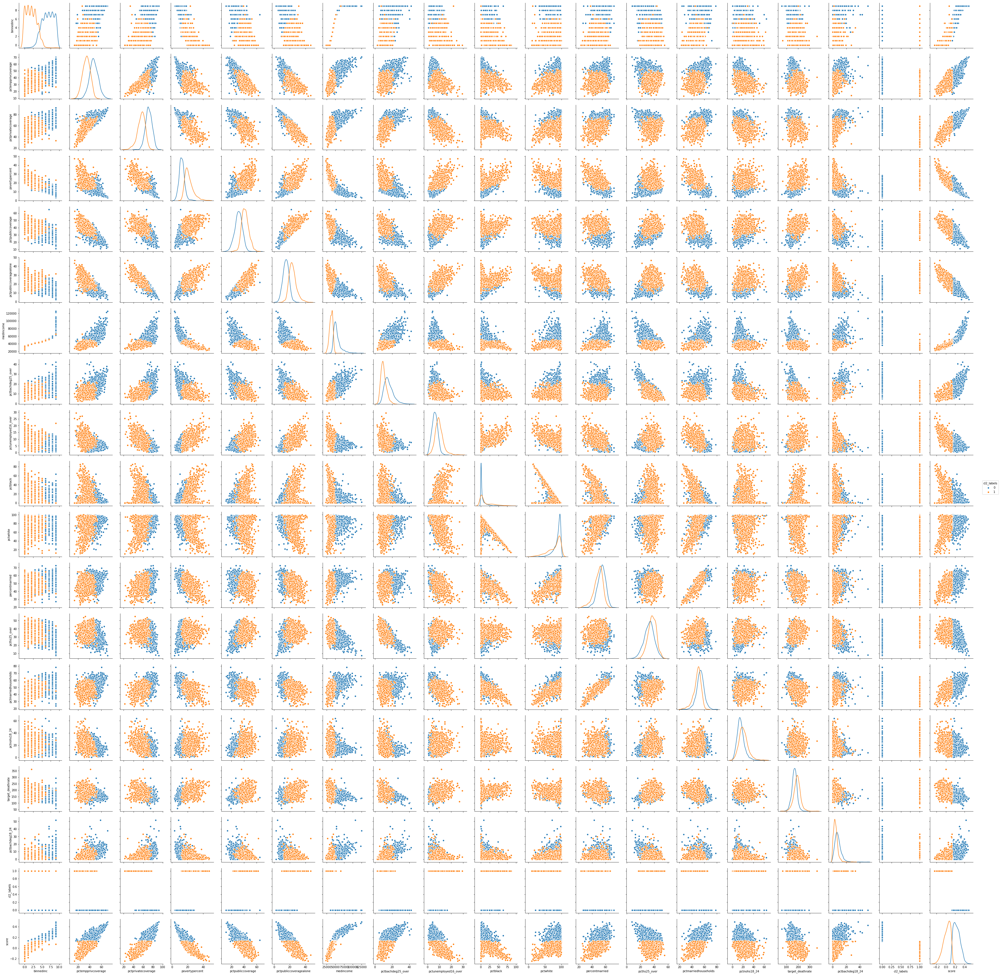

In [233]:
sns.pairplot(tr2, diag_kind='kde', hue='cl2_labels')
plt.show()

In [205]:
pls.state.value_counts()

Mississippi       16
Georgia            6
Alabama            6
Arkansas           5
Kentucky           4
Louisiana          3
South Dakota       2
Arizona            1
New York           1
West Virginia      1
North Dakota       1
New Mexico         1
Illinois           1
South Carolina     1
Tennessee          1
Name: state, dtype: int64

In [206]:
coeff

array([ 0.18054747,  0.07496113,  0.07481404, -0.0704274 , -0.06679054,
       -0.06649599,  0.05549177,  0.05184621, -0.04225637, -0.03493761,
        0.0340944 ,  0.03361043, -0.03168961,  0.03005173, -0.02721241,
       -0.0259075 ,  0.02309707])

In [211]:
e = list(tr1.columns)
e

['binnedinc',
 'pctempprivcoverage',
 'pctprivatecoverage',
 'povertypercent',
 'pctpubliccoverage',
 'pctpubliccoveragealone',
 'medincome',
 'pctbachdeg25_over',
 'pctunemployed16_over',
 'pctblack',
 'pctwhite',
 'percentmarried',
 'pcths25_over',
 'pctmarriedhouseholds',
 'pctnohs18_24',
 'target_deathrate',
 'pctbachdeg18_24']

In [212]:
pd.DataFrame({'feature':e, 'coefficients':coeff})

,feature,coefficients
0,binnedinc,0.180547
1,pctempprivcoverage,0.074961
2,pctprivatecoverage,0.074814
3,povertypercent,-0.070427
4,pctpubliccoverage,-0.066791
5,pctpubliccoveragealone,-0.066496
6,medincome,0.055492
7,pctbachdeg25_over,0.051846
8,pctunemployed16_over,-0.042256
9,pctblack,-0.034938
